In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from glob import glob 
import pickle

import plotly.graph_objs as go
from urllib.request import urlopen
import plotly.express as px
import plotly
import matplotlib.pyplot as plt
import geopandas as gpd

In [13]:
node_info = pd.read_csv("/project/biocomplexity/nssac/EpiHiperSynPop/v1.9.0/usa_va_2017_SynPop/va_persontrait_epihiper.txt", skiprows=1)
map_df = gpd.read_file("../data/census_tract/tl_2021_51_tract.shx")
map_df = map_df[map_df.STATEFP == "51"]
map_df["admin3"] = map_df.NAME.apply(lambda row: row.replace(".", "")) #[map_df.NAME == "10200"]
# map_df[map_df.NAME == "9801"] #.plot()

node_info["census_tract"] = node_info.admin3.apply(lambda row: str(row)[:-2] + "." + str(row)[-2:])
node_to_census = node_info.set_index("pid")["census_tract"].to_dict() #[node_info.admin2 == 1].admin3.unique() #.info() #.admin3.value_counts()
tract_pops = node_info.census_tract.apply(lambda row: row.replace(".00", "")).value_counts()

In [17]:
def get_vulnerability_by_ct(data_path):
    map_df_copy = map_df.copy()
    
    with open(data_path, "rb") as src:
        replicate_data = pickle.load(src)
        
    orig_data = replicate_data.copy()
    offset = 0.1

    data = np.array(orig_data[offset])
    data = np.concatenate(data)
    unique, counts = np.unique(data, return_counts=True)
    count_to_nodes = {int(i):[] for i in np.unique(counts)}
    for ix, node in enumerate(unique):
        if "rep" in node:
            continue
        count_to_nodes[int(counts[ix])].append(int(node))
    node_to_reps = {int(node):[] for node in unique if "rep" not in str(node)}
    for rep_data in orig_data[offset]:
        rep = rep_data[0]
        for node in rep_data[1:]:
            node_to_reps[int(node)].append(rep)
            
    census_infections = {tract.replace(".00", ""):0 for tract in node_info.census_tract.unique()}
    for node, reps in node_to_reps.items():
        tract = node_to_census[node].replace(".00", "")
        census_infections[tract] += len(reps)

    for tract in census_infections:
        census_infections[tract] /= (tract_pops[tract] * 60)
        
    map_df_copy["vulnerability"] = map_df_copy.NAME.apply(lambda row: census_infections[row] if row in census_infections else np.nan)        
    
    return map_df_copy

def scenario_to_title(scenario):
    scenario = scenario.split("/")[-1]
    scenario = scenario.replace("tau_", "Variant 1: ")
    scenario = scenario.replace("_var2_1.4_seed2p", "")
    scenario = scenario.replace("_5", ", Location: 5")
    scenario = scenario.replace("_seed2t_", ", Emergence Day: ")
#     scenario = scenario.replace("", "")
    return scenario

def plot_vulnerability_map(map_df, scenario, ax, extra_title =""):
    map_df.plot(column="vulnerability", ax=ax, legend=True, \
                legend_kwds={'label': "Vulnerability by Census Tract\nInfections per pop per replicate", 'orientation': "horizontal"}, \
                missing_kwds={'color': 'lightgrey'})
    ax.axis("off")
    
    title = scenario_to_title(scenario)
    if extra_title != "":
        title = extra_title+"\n" + title
    ax.set_title(title)

In [ ]:
tract_lens = node_info.groupby("admin3")["admin2"].unique()
# tract_lens = tract_lens.apply(lambda row: len(row))
tract_lens[980100] #.sort_values()

In [11]:
base_data = "/gpfs/gpfs0/project/bii_nssac/COVID-19_USA_EpiHiper/rivanna/20210827-var_surv"
exp = "exp7"
scenarios = [i.split("/")[-1] for i in glob(f"{base_data}/{exp}/*")]
scenario = scenarios[0]
print(scenario)
base = "/project/biocomplexity/biosurveillance/EpiHiper/postProcessing/nodeProfiles"

v2_file = f"{base}/{exp}/{scenario}_node_V2_binary_infection_profile.pkl"
v2_reinfection_file = f"{base}/{exp}/{scenario}_node_V2_from_V1_reinfection_profile.pkl"
v1_file = f"{base}/{exp}/{scenario}_node_V1_binary_infection_profile.pkl"

tau_0.03_var2_1.4_seed2p_51_seed2t_150_cross1by2_0.75


In [14]:
v1_data = get_vulnerability_by_ct(v1_file)

<ipython-input-8-4120ec860975>:10: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  data = np.array(orig_data[offset])


In [15]:
v2_data = get_vulnerability_by_ct(v2_file)
v2_re_data = get_vulnerability_by_ct(v2_reinfection_file)

<ipython-input-8-4120ec860975>:10: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  data = np.array(orig_data[offset])
<ipython-input-8-4120ec860975>:10: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  data = np.array(orig_data[offset])


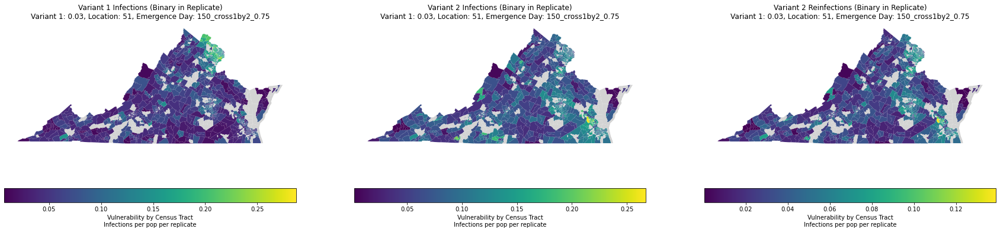

In [19]:
fig, axs = plt.subplots(figsize=(30,8), ncols=3)

ax=axs[0]
plot_vulnerability_map(v1_data, scenario, ax=ax, extra_title = "Variant 1 Infections (Binary in Replicate)")

ax=axs[1]
plot_vulnerability_map(v2_data, scenario, ax=ax, extra_title = "Variant 2 Infections (Binary in Replicate)")

ax=axs[2]
plot_vulnerability_map(v2_re_data, scenario, ax=ax, extra_title = "Variant 2 Reinfections (Binary in Replicate)")

plt.savefig("virginia_vulnerability_by_census_tract.png", dpi=100, facecolor="white", bbox_inches="tight")

In [4]:
with open(f"{base}/{exp}/{scenario}_node_V2_binary_infection_profile.pkl", "rb") as src:
    replicate_data = pickle.load(src)

tau_0.03_var2_1.4_seed2p_51_seed2t_150_cross1by2_0.75


In [12]:
orig_data = replicate_data.copy()
offset = 0.1

# def get_bins_needed_for_rep_coverage(orig_data, offset):
data = np.array(orig_data[offset])
data = np.concatenate(data)
unique, counts = np.unique(data, return_counts=True)
count_to_nodes = {int(i):[] for i in np.unique(counts)}
for ix, node in enumerate(unique):
    if "rep" in node:
        continue
    count_to_nodes[int(counts[ix])].append(int(node))
node_to_reps = {int(node):[] for node in unique if "rep" not in str(node)}
for rep_data in orig_data[offset]:
    rep = rep_data[0]
    for node in rep_data[1:]:
        node_to_reps[int(node)].append(rep)

# running_reps = set()
# for rep_count in reversed(np.unique(counts)):
#     new_reps = [node_to_reps[int(node)] for node in count_to_nodes[rep_count]]
#     new_reps = set(np.array(new_reps).ravel())
#     running_reps = running_reps.union(new_reps)
#     if len(running_reps) == 60:
#         break

#     return rep_count

<ipython-input-12-61fafd667762>:5: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  data = np.array(orig_data[offset])


In [64]:
len(map_df.NAME.unique()) #[map_df.NAME == "901"] #.info() #[map_df.admin3 == "930100"]

1417

In [ ]:
map_df

In [67]:
node_info["census_tract"] = node_info.admin3.apply(lambda row: str(row)[:-2] + "." + str(row)[-2:])
node_to_census = node_info.set_index("pid")["census_tract"].to_dict() #[node_info.admin2 == 1].admin3.unique() #.info() #.admin3.value_counts()
tract_pops = node_info.census_tract.apply(lambda row: row.replace(".00", "")).value_counts()

In [85]:
census_infections = {tract.replace(".00", ""):0 for tract in node_info.census_tract.unique()}
for node, reps in node_to_reps.items():
    tract = node_to_census[node].replace(".00", "")
    census_infections[tract] += len(reps)
    
for tract in census_infections:
    census_infections[tract] /= (tract_pops[tract] * 60)

In [136]:
map_df["vulnerability"] = map_df.NAME.apply(lambda row: census_infections[row] if row in census_infections else np.nan)

In [145]:
(map_df.NAME.value_counts() > 1).sum() # 0f 1660

248

In [156]:
map_df.drop(columns = "TRACTCE GEOID MTFCC FUNCSTAT ALAND AWATER".split()).to_csv("vulnerability_virginia_census_tract_geopandas.csv", index=False)

In [157]:
pd.read_csv("vulnerability_virginia_census_tract_geopandas.csv")

,STATEFP,COUNTYFP,NAME,NAMELSAD,INTPTLAT,INTPTLON,geometry,vulnerability
0,51,800,757.03,Census Tract 757.03,36.685065,-76.675468,"POLYGON ((-76.751087 36.693382, -76.751083 36....",0.112568
1,51,800,758.03,Census Tract 758.03,36.686257,-76.813218,"POLYGON ((-76.897562 36.644072, -76.897551 36....",0.098431
2,51,800,757.01,Census Tract 757.01,36.704904,-76.602092,"POLYGON ((-76.632026 36.726749, -76.632001 36....",0.111238
3,51,800,758.02,Census Tract 758.02,36.608468,-76.820735,"POLYGON ((-76.930837 36.559736, -76.930668 36....",0.111252
4,51,800,754.04,Census Tract 754.04,36.754049,-76.627223,"POLYGON ((-76.658124 36.760706, -76.657751 36....",0.105986
...,...,...,...,...,...,...,...,...
2193,51,25,9302.02,Census Tract 9302.02,36.782621,-77.821587,"POLYGON ((-77.833433 36.779954, -77.833176 36....",0.052008
2194,51,810,422.02,Census Tract 422.02,36.853921,-76.079299,"POLYGON ((-76.092083 36.852081, -76.092067 36....",0.100161
2195,51,810,428.01,Census Tract 428.01,36.826683,-76.087924,"POLYGON ((-76.097524 36.821055, -76.097501 36....",0.121031
2196,51,810,454.21,Census Tract 454.21,36.773088,-76.062275,"POLYGON ((-76.08057 36.792061, -76.080094 36.7...",0.133152


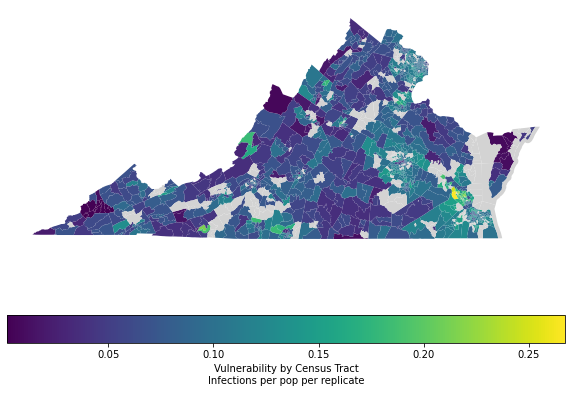

In [139]:
fig, ax = plt.subplots(figsize=(10,8))
map_df.plot(column="vulnerability", ax=ax, legend=True, \
            legend_kwds={'label': "Vulnerability by Census Tract\nInfections per pop per replicate", 'orientation': "horizontal"}, \
            missing_kwds={'color': 'lightgrey'})
ax.axis("off")
plt.savefig("virginia_vulnerability_by_census_tract.png", dpi=100, facecolor="white")

In [118]:
map_df[map_df.NAME == "9801"] #.plot(column="vulnerability")


,NAME,STATEFP,COUNTYFP,TRACTCE,AFFGEOID,GEOID,LSAD,ALAND,AWATER,geometry,admin3,vulerability,vulnerability
745,9801,51,590,980100,1400000US51590980100,51590980100,CT,6194997,148171,"POLYGON ((-79.37330 36.56957, -79.36675 36.573...",9801,0.05303,0.05303
780,9801,51,740,980100,1400000US51740980100,51740980100,CT,2775023,970586,"POLYGON ((-76.31190 36.81439, -76.30636 36.817...",9801,0.05303,0.05303
871,9801,51,153,980100,1400000US51153980100,51153980100,CT,84731568,192020,"POLYGON ((-77.56355 38.61388, -77.56194 38.614...",9801,0.05303,0.05303
873,9801,51,710,980100,1400000US51710980100,51710980100,CT,2336841,2575385,"POLYGON ((-76.33360 36.88222, -76.33101 36.888...",9801,0.05303,0.05303
1101,9801,51,053,980100,1400000US51053980100,51053980100,CT,52479528,468269,"POLYGON ((-77.89167 37.11649, -77.88885 37.116...",9801,0.05303,0.05303
1202,9801,51,087,980100,1400000US51087980100,51087980100,CT,8825213,46253,"POLYGON ((-77.34064 37.50339, -77.34066 37.518...",9801,0.05303,0.05303
1387,9801,51,670,980100,1400000US51670980100,51670980100,CT,6057701,0,"POLYGON ((-77.28871 37.28908, -77.28696 37.289...",9801,0.05303,0.05303
1395,9801,51,155,980100,1400000US51155980100,51155980100,CT,7060074,831437,"POLYGON ((-80.58007 37.18515, -80.57681 37.188...",9801,0.05303,0.05303
1475,9801,51,135,980100,1400000US51135980100,51135980100,CT,90045299,464441,"POLYGON ((-77.98552 37.04591, -77.98224 37.049...",9801,0.05303,0.05303
1531,9801,51,059,980100,1400000US51059980100,51059980100,CT,3111677,24647,"POLYGON ((-77.21569 38.75529, -77.21243 38.756...",9801,0.05303,0.05303


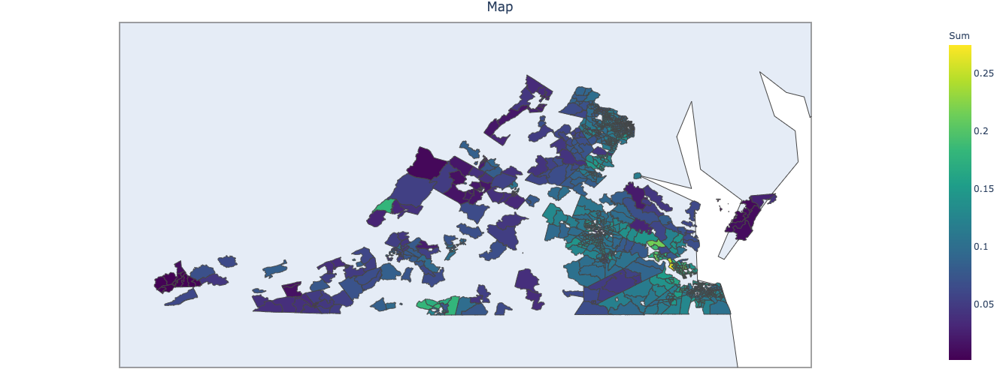

In [106]:
plot_map_df = map_df.set_index("NAME")
fig = px.choropleth(plot_map_df, geojson=plot_map_df.geometry, 
                    locations=plot_map_df.index, color="vulnerability",
                    height=500,
                    color_continuous_scale="Viridis")
fig.update_geos(fitbounds="locations", visible=True)
fig.update_layout(
    title_text='Map'
)
fig.update(layout = dict(title=dict(x=0.5)))
fig.update_layout(
    margin={"r":0,"t":30,"l":10,"b":10},
    coloraxis_colorbar={
        'title':'Sum'})
fig.show()

In [ ]:
# # fig = px.choropleth(results, geojson=counties, locations='fips', color=np.log10(results['value'].replace(0, 1)), facet_col="Test Type",
# for ttype in ["Genomic", "SGTF"]:
#     test_name = "Genomic" if ttype == "Genomic" else "SGTF (Genomic + 10% of Cases)"
    
#     for omicron_scenario in all_options["omicron_scenario"].unique():
#         omicron_scenario_name = ": One Case Per Day" if omicron_scenario == "single_case" else ": Logistic Growth"
#         for sample_type in all_options.distribution.unique():

#             to_plot = all_options[(all_options["Test Type"] == ttype) & (all_options["distribution"] == sample_type) & (all_options["omicron_scenario"] == omicron_scenario)]
#         #     fig = px.choropleth(to_plot, geojson=counties, locations='fips', color=np.log10(to_plot['value'].replace(0, 1)), facet_col="distribution",
#             fig = px.choropleth(to_plot, geojson=counties, locations='fips', color=np.log10(to_plot['value'].replace(0, 1)),
#             #                             endpoints=endpts, colorscale=colorscale,
#                                        color_continuous_scale="Viridis",
#                                        range_color=(0, 2), #variant_datas.value.max()
#                                        scope="usa",
#                                        labels={'unemp':'unemployment rate'}
#                                       )

#             fig.update_geos(fitbounds="geojson", visible=True)
#             fig.update_layout(title={
#                                 'text': f"{sample_type} in Virginia{omicron_scenario_name} - {test_name}",
#                                 'y':0.95,
#                                 'x':0.5,
#                                 'xanchor': 'center',
#                                 'yanchor': 'top'})
#             # fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0}) #, 
#             #                   title={
#             #                     'text': f"{variant_name} in Virginia",
#             #                     'y':0.95,
#             #                     'x':0.5,
#             #                     'xanchor': 'center',
#             #                     'yanchor': 'top'})
#             # fig.update_layout(transition = {'duration': 1000})
#             # fig.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 400
#             fig.update_layout(coloraxis_colorbar=dict(title='Days Till Detection', tickprefix='1e'))
#             fig.show()
#             fig.write_html(f"virginia_detection_days_by_county_{sample_type.lower().replace(' ', '_')}_{omicron_scenario}_{ttype.lower()}.html")